# Remote Sensing

Author: Gabriel TRUONG, Sofia BOUMAHRAT, Enzo FRAGALE

In this workshop, we decided to study the area of **Chamonix Mont-Blance**, France. This city is very nice both in summer and winter. 
In summer the activities are very different from the winter's. However the playground is the same. Obviously there is snow in winter.
Let's study the snow coverage of this town ! 

## Settings

In [1]:
# Planetary Computer, STAC
import pystac
from pystac.extensions.eo import EOExtension as eo
import pystac_client
import planetary_computer

# Stats and vector data
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely

# Image processing
import rasterio as rio
import rasterio.plot, rasterio.features, rasterio.mask, rasterio.fill  # Not loaded by default
import skimage.morphology, skimage.measure

# Plotting
import matplotlib.pyplot as plt
import IPython.display
import ipywidgets
import leafmap

# For nice HTML outputs
import rich.table

In [2]:
plt.style.use('default')
folium_tile = "CartoDB Positron"

**Chamonix Mont-Blanc** is located in the department 74 called Haute Savoie. 

In [3]:
wfs_communes = "https://wxs.ign.fr/topographie/geoportail/wfs?SERVICE=WFS&VERSION=2.0.0" \
               "&request=GetFeature&OUTPUTFORMAT=application/json&typename=BDTOPO_V3:commune&CQL_FILTER=code_insee_du_departement=74"

In [4]:
communes = gpd.read_file(wfs_communes)
communes.drop(['date_creation', 'date_modification'], axis=1, inplace=True)
communes.explore(tiles=folium_tile)



The department is quite large with small cities, let's narrow down the area of interest to only the city of Chamonix

In [5]:
area_of_interest = communes.loc[communes.code_insee == '74056']

In [6]:
bbox = tuple(area_of_interest.bounds.values[0])
bbox

(6.81372051, 45.82802986, 7.0444721, 46.03115001)

## Import Data from Sentinel catalog

We will take a time frame between June to February to have data both in summer and winter. 

In [7]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [38]:
# Searching for S2-L2 products within ROI and time range
time_of_interest = "2021-06-01/2022-02-01"

search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,  # or intersects=area_of_interest
    datetime=time_of_interest,
    sortby='datetime',  # By default the query returns latest first, here we sortby ascending
    query={"eo:cloud_cover": {"lt": 10}},  # cloud cover lower than 10%
)
items = search.item_collection()
print(f"Found {len(items)} items\n")

Found 33 items



In [39]:
# TODO: Explore STAC items
items

ID: S2B_MSIL2A_20210613T102559_R108_T32TLS_20210623T173020
"Bounding Box: [6.372989807609915, 45.93641922924405, 7.835955516975941, 46.947573655919015]"
Datetime: 2021-06-13 10:25:59.024000+00:00
datetime: 2021-06-13T10:25:59.024000Z
platform: Sentinel-2B
proj:epsg: 32632
instruments: ['msi']
s2:mgrs_tile: 32TLS
constellation: Sentinel 2
s2:granule_id: S2B_OPER_MSI_L2A_TL_ESRI_20210623T173021_A022299_T32TLS_N03.00
eo:cloud_cover: 6.798074


In [48]:
# Convert items metadata to GeoDataFrame
gdf_items = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
#gdf_items = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")

gdf_items.head(10)

,geometry,datetime,platform,proj:epsg,instruments,s2:mgrs_tile,constellation,s2:granule_id,eo:cloud_cover,s2:datatake_id,...,s2:cloud_shadow_percentage,s2:nodata_pixel_percentage,s2:unclassified_percentage,s2:dark_features_percentage,s2:not_vegetated_percentage,s2:degraded_msi_data_percentage,s2:high_proba_clouds_percentage,s2:reflectance_conversion_factor,s2:medium_proba_clouds_percentage,s2:saturated_defective_pixel_percentage
0,"POLYGON ((6.37299 46.92356, 7.81471 46.94757, ...",2021-06-13T10:25:59.024000Z,Sentinel-2B,32632,[msi],32TLS,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210623T173021_A0222...,6.798074,GS2B_20210613T102559_022299_N03.00,...,0.922903,0.002840,2.249071,0.804682,8.026565,0.0,5.253038,0.970294,1.522318,0.0
1,"POLYGON ((6.41593 46.02435, 7.83411 46.04763, ...",2021-06-13T10:25:59.024000Z,Sentinel-2B,32632,[msi],32TLR,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210623T210055_A0222...,2.148758,GS2B_20210613T102559_022299_N03.00,...,0.086871,0.000119,2.952960,0.827994,14.612222,0.0,1.180804,0.970294,0.967954,0.0
2,"POLYGON ((5.62649 46.92357, 7.06566 46.88146, ...",2021-06-13T10:25:59.024000Z,Sentinel-2B,32631,[msi],31TGM,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210623T132104_A0222...,1.989110,GS2B_20210613T102559_022299_N03.00,...,0.341625,0.000113,0.820035,0.303586,5.822330,0.0,1.333760,0.970294,0.643416,0.0
3,"POLYGON ((5.58355 46.02437, 6.99932 45.98355, ...",2021-06-13T10:25:59.024000Z,Sentinel-2B,32631,[msi],31TGL,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210623T185819_A0222...,3.608239,GS2B_20210613T102559_022299_N03.00,...,0.259057,0.000083,2.898204,0.700964,9.400813,0.0,2.243027,0.970294,1.359107,0.0
4,"POLYGON ((6.37299 46.92356, 7.81471 46.94757, ...",2021-06-18T10:30:21.024000Z,Sentinel-2A,32632,[msi],32TLS,Sentinel 2,S2A_OPER_MSI_L2A_TL_ESRI_20210624T084135_A0312...,6.109157,GS2A_20210618T103021_031279_N03.00,...,0.863119,0.000000,2.534982,0.619129,7.754131,0.0,4.534408,0.969251,1.393608,0.0
5,"POLYGON ((6.41593 46.02435, 7.83411 46.04763, ...",2021-07-18T10:30:31.024000Z,Sentinel-2A,32632,[msi],32TLR,Sentinel 2,S2A_OPER_MSI_L2A_TL_ESRI_20210719T005433_A0317...,8.885979,GS2A_20210718T103031_031708_N03.00,...,1.134333,0.000033,3.202124,2.209011,12.651926,0.0,5.938370,0.967820,2.396459,0.0
6,"POLYGON ((5.62649 46.92357, 7.06566 46.88146, ...",2021-07-18T10:30:31.024000Z,Sentinel-2A,32631,[msi],31TGM,Sentinel 2,S2A_OPER_MSI_L2A_TL_ESRI_20210719T001750_A0317...,3.586329,GS2A_20210718T103031_031708_N03.00,...,0.344508,0.000013,1.116284,0.397381,6.824162,0.0,2.512978,0.967820,1.010335,0.0
7,"POLYGON ((6.37299 46.92356, 7.81471 46.94757, ...",2021-08-12T10:25:59.025000Z,Sentinel-2B,32632,[msi],32TLS,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210812T212254_A0231...,1.552202,GS2B_20210812T102559_023157_N03.00,...,0.602988,0.000070,1.527527,1.893469,11.680828,0.0,0.896394,0.972945,0.509109,0.0
8,"POLYGON ((6.41593 46.02435, 7.83411 46.04763, ...",2021-08-12T10:25:59.025000Z,Sentinel-2B,32632,[msi],32TLR,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210812T224459_A0231...,6.847109,GS2B_20210812T102559_023157_N03.00,...,1.291263,0.000030,3.611927,2.976142,15.495841,0.0,4.507256,0.972945,2.244934,0.0
9,"POLYGON ((5.62649 46.92357, 7.06566 46.88146, ...",2021-08-12T10:25:59.025000Z,Sentinel-2B,32631,[msi],31TGM,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210812T220841_A0231...,0.529056,GS2B_20210812T102559_023157_N03.00,...,0.143490,0.000007,0.460695,0.503711,7.265636,0.0,0.197561,0.972945,0.141061,0.0


In [41]:
gdf_items.tail(5)

,geometry,datetime,platform,proj:epsg,instruments,s2:mgrs_tile,constellation,s2:granule_id,eo:cloud_cover,s2:datatake_id,...,s2:cloud_shadow_percentage,s2:nodata_pixel_percentage,s2:unclassified_percentage,s2:dark_features_percentage,s2:not_vegetated_percentage,s2:degraded_msi_data_percentage,s2:high_proba_clouds_percentage,s2:reflectance_conversion_factor,s2:medium_proba_clouds_percentage,s2:saturated_defective_pixel_percentage
28,"POLYGON ((5.58355 46.02437, 6.99932 45.98355, ...",2022-01-24T10:33:31.024000Z,Sentinel-2A,32631,[msi],31TGL,Sentinel 2,S2A_OPER_MSI_L2A_TL_ESRI_20220124T233022_A0344...,2.147087,GS2A_20220124T103331_034425_N03.00,...,4.464511,0.000965,7.333544,25.601453,8.134253,0.0000,0.935915,1.032785,1.207244,0.0
29,"POLYGON ((6.37299 46.92356, 7.81471 46.94757, ...",2022-01-29T10:31:59.024000Z,Sentinel-2B,32632,[msi],32TLS,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20220227T172656_A0255...,5.107372,GS2B_20220129T103159_025588_N04.00,...,0.062534,0.062568,0.041376,22.107276,14.814840,0.0000,0.490763,1.031781,1.289196,0.0
30,"POLYGON ((6.37299 46.92356, 7.81471 46.94757, ...",2022-01-29T10:31:59.024000Z,Sentinel-2B,32632,[msi],32TLS,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20220213T210238_A0255...,5.107372,GS2B_20220129T103159_025588_N04.00,...,0.062534,0.062568,0.041376,22.107276,14.814840,0.0000,0.490763,1.031781,1.289196,0.0
31,"POLYGON ((6.41593 46.02435, 7.83411 46.04763, ...",2022-01-29T10:31:59.024000Z,Sentinel-2B,32632,[msi],32TLR,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20220227T131008_A0255...,3.471676,GS2B_20220129T103159_025588_N04.00,...,0.351279,0.024330,0.138023,26.646939,23.404726,0.0015,1.274599,1.031781,2.025808,0.0
32,"POLYGON ((6.41593 46.02435, 7.83411 46.04763, ...",2022-01-29T10:31:59.024000Z,Sentinel-2B,32632,[msi],32TLR,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20220213T224906_A0255...,3.471676,GS2B_20220129T103159_025588_N04.00,...,0.351279,0.024330,0.138023,26.646939,23.404726,0.0015,1.274599,1.031781,2.025808,0.0


In [42]:
gdf_items.bounds.iloc[:5]


,minx,miny,maxx,maxy
0,6.372990,45.936419,7.835956,46.947574
1,6.415935,45.037023,7.854365,46.047628
2,5.579459,45.895735,7.065657,46.923573
3,5.538707,44.997588,6.999321,46.024365
4,6.372990,45.936419,7.835956,46.947574


Text(0, 0.5, 'Cloud cover (%)')

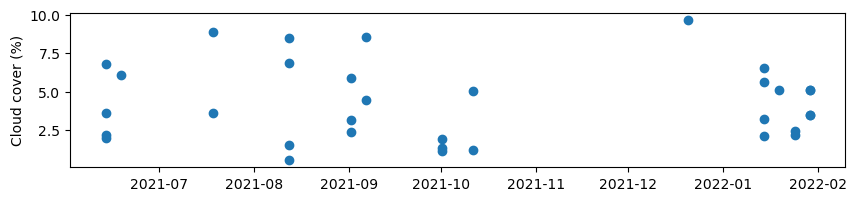

In [43]:
# Convert timestamps to datetime objects if you need to plot a time serie
gdf_items["datetime"] = pd.to_datetime(gdf_items.datetime)
fig, ax = plt.subplots(figsize=(10,2))
plt.scatter(gdf_items.datetime, gdf_items["eo:cloud_cover"])
ax.set_ylabel("Cloud cover (%)")

In [44]:
# PNG image preview
items[0].assets["rendered_preview"]

href: https://planetarycomputer.microsoft.com/api/data/v1/item/preview.png?collection=sentinel-2-l2a&item=S2B_MSIL2A_20210613T102559_R108_T32TLS_20210623T173020&assets=visual&asset_bidx=visual%7C1%2C2%2C3&nodata=0
Title: Rendered preview
Media type: image/png
Roles: ['overview']
Owner:
rel: preview


In [45]:
# You can access a specific dataset in a STAC item using its URL (aka href)
items[0].assets["rendered_preview"].href

'https://planetarycomputer.microsoft.com/api/data/v1/item/preview.png?collection=sentinel-2-l2a&item=S2B_MSIL2A_20210613T102559_R108_T32TLS_20210623T173020&assets=visual&asset_bidx=visual%7C1%2C2%2C3&nodata=0'

## Display Images
We will try to see images at different period to have an overview of the changing of seasons. 
Below we can see that the changing is 

In [46]:
IPython.display.Image(url=items[0].assets["rendered_preview"].href, width=800) #2021-06-12

In [47]:
#Store all images in list to display after
images = {it.id: IPython.display.Image(url=it.assets["rendered_preview"].href, width=800) for it in items}
names = list(images.keys())
images

{'S2B_MSIL2A_20210613T102559_R108_T32TLS_20210623T173020': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210613T102559_R108_T32TLR_20210623T210053': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210613T102559_R108_T31TGM_20210623T132103': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210613T102559_R108_T31TGL_20210623T185817': <IPython.core.display.Image object>,
 'S2A_MSIL2A_20210618T103021_R108_T32TLS_20210624T084134': <IPython.core.display.Image object>,
 'S2A_MSIL2A_20210718T103031_R108_T32TLR_20210719T005432': <IPython.core.display.Image object>,
 'S2A_MSIL2A_20210718T103031_R108_T31TGM_20210719T001748': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210812T102559_R108_T32TLS_20210812T212253': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210812T102559_R108_T32TLR_20210812T224457': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210812T102559_R108_T31TGM_20210812T220839': <IPython.core.display.Image object>,
 'S2B_MSIL2A_20210812T102559_R108_T31TGL

In [36]:
# Interactive function to show images, parameter name must be same than in interact() arguments
def loadimg(i=0):
    IPython.display.display(images[names[i]])
    return names[i]

In [54]:
ipywidgets.interact(loadimg,  i=(0, len(images)-1)) #All pictures
#ipywidgets.interact(loadimg,  i=[3,29]) #example of before after

interactive(children=(IntSlider(value=0, description='i', max=32), Output()), _dom_classes=('widget-interact',…

<function __main__.loadimg(i=0)>

In [55]:
# Two dates that will display the difference between summer and winter (13/06/2021 & 29/01/2022)
before, after = items[3], items[29]
intermediate_1, intermediate_2 = items[18],items[20]
before, after

(<Item id=S2B_MSIL2A_20210613T102559_R108_T31TGL_20210623T185817>,
 <Item id=S2B_MSIL2A_20220129T103159_R108_T32TLS_20220227T172655>)

## Normalized Difference Vegetative Index (NDVI)

This index is graphical indicator that is used in remote sensing measurements to study the live green content vegtation of a target. 
The NDVI is calculated from these individual measurements as follows:

$$ NDVI = \frac{NIR - Red}{NIR + Red}$$

In [56]:
table = rich.table.Table("Asset Key", "Description")
for asset_key, asset in before.assets.items():
    table.add_row(asset_key, asset.title)
table

┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Asset Key          ┃ Description                           ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ AOT                │ Aerosol optical thickness (AOT)       │
│ B01                │ Band 1 - Coastal aerosol - 60m        │
│ B02                │ Band 2 - Blue - 10m                   │
│ B03                │ Band 3 - Green - 10m                  │
│ B04                │ Band 4 - Red - 10m                    │
│ B05                │ Band 5 - Vegetation red edge 1 - 20m  │
│ B06                │ Band 6 - Vegetation red edge 2 - 20m  │
│ B07                │ Band 7 - Vegetation red edge 3 - 20m  │
│ B08                │ Band 8 - NIR - 10m                    │
│ B09                │ Band 9 - Water vapor - 60m            │
│ B11                │ Band 11 - SWIR (1.6) - 20m            │
│ B12                │ Band 12 - SWIR (2.2) - 20m            │
│ B8A                │ Band 8A - Vegetation red edge 4 - 20m │
│ SCL                │ Scene classfication map (SCL)         │
│ WVP                │ Water vapour (WVP)                    │
│ visual             │ True color image                      │
│ preview            │ Thumbnail                             │
│ safe-manifest      │ SAFE manifest                         │
│ granule-metadata   │ Granule metadata                      │
│ inspire-metadata   │ INSPIRE metadata                      │
│ product-metadata   │ Product metadata                      │
│ datastrip-metadata │ Datastrip metadata                    │
│ tilejson           │ TileJSON with default rendering       │
│ rendered_preview   │ Rendered preview                      │
└────────────────────┴───────────────────────────────────────┘

In [57]:
m = leafmap.Map()
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=before.datetime.strftime('%Y.%m.%d'),
    item=before.id,
    assets=["B08", "B04", "B03"]

)
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [58]:
#Graph that display the difference of NDVI in summer and winter
m = leafmap.Map()
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=after.datetime.strftime('%Y.%m.%d'),
    item=after.id,
    assets=["B04", "B03", "B02", "B08"],
    expression="(B08 - B04) / (B08 + B04)",
    rescale="-0.5,0.5",
    colormap_name="rdylgn",
)
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=before.datetime.strftime('%Y.%m.%d'),
    item=before.id,
    assets=["B04", "B03", "B02", "B08"],
    expression="(B08 - B04) / (B08 + B04)",
    rescale="-0.5,0.5",
    colormap_name="rdylgn",
)
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

The last graph displays the different level of intensity of NDVI between summer and winter. The difference is very noticeable. We can see the difference by only enabling the *before* layer and slowly appending the *after* layer. 

## Normalized Difference Snow Index

NDSI is a measure of the relative magnitude of the reflectance difference between visible (green) and shortwave infrared (SWIR). It controls variance of two bands (one in the near infrared or short-wave infrared and another one in the visible parts of the spectrum). This is useful for snow mapping. Snow is not only very reflective in the visible parts of the electromagnetic spectrum but also highly absorptive in the NIR or the short-wave infrared part of the spectrum, while the most cloud reflectance remains to be high in the same parts of the spectrum, this allows good separation of most clouds and snow. (source: [EOS](https://eos.com/make-an-analysis/ndsi/))

$$ NDSI = \frac{TM_{band2} - TM_{band5}}{TM_{band2}+TM_{band5}} $$*


$$ NDSI = \frac{GREEN - SWIR}{GREEN+SWIR} $$

In [108]:
#Graph that display the difference of NDSI in summer and winter
m = leafmap.Map()
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=after.datetime.strftime('%Y.%m.%d'),
    item=after.id,
    assets=["B02","B12"],
    expression="(B02 - B12) / (B02 + B12)",
    rescale="-0.5,0.5",
    colormap_name="rdylgn",
)
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=before.datetime.strftime('%Y.%m.%d'),
    item=before.id,
    assets=["B02","B12"],
    expression="(B02 - B12) / (B02 + B12)",
    rescale="-0.5,0.5",
    colormap_name="rdylgn",
)
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

By the same approach, we compare the intensity of NDSI between Summer & Winter. The difference is even more flagrant.

## Rasterio
The best library to ease the use of GDAL with Python.

In [60]:
with rio.open(before.assets["visual"].href) as ds:
    profile = ds.profile
    # Do not not read data for now
    #array = data.read()

ds

<closed DatasetReader name='https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/31/T/GL/2021/06/13/S2B_MSIL2A_20210613T102559_N0300_R108_T31TGL_20210623T185817.SAFE/GRANULE/L2A_T31TGL_A022299_20210613T103528/IMG_DATA/R10m/T31TGL_20210613T102559_TCI_10m.tif?st=2022-12-09T11%3A49%3A23Z&se=2022-12-17T11%3A49%3A24Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-12-10T11%3A49%3A22Z&ske=2022-12-17T11%3A49%3A22Z&sks=b&skv=2021-06-08&sig=Zt13Uti1Sh6kgqH5PWiudASKtGnMO6pN1NW5oCa5zW4%3D' mode='r'>

In [61]:
rich.print(profile)

{
    'driver': 'GTiff',
    'dtype': 'uint8',
    'nodata': 0.0,
    'width': 10980,
    'height': 10980,
    'count': 3,
    'crs': CRS.from_epsg(32631),
    'transform': Affine(10.0, 0.0, 699960.0,
       0.0, -10.0, 5100000.0),
    'blockxsize': 512,
    'blockysize': 512,
    'tiled': True,
    'compress': 'deflate',
    'interleave': 'pixel'
}

In [62]:
# Let's keep a reference to the CRS
crs = profile['crs']
crs

CRS.from_epsg(32631)

In [63]:
# To avoid loading the full image, we need to build a window
# To do so we need a warped (i.e. projected) boundind box, and the source image transform
warped_aoi_bounds = rio.warp.transform_bounds("epsg:4326", crs, *bbox)
warped_aoi_bounds

(795131.7939215794, 5082016.7418421395, 814134.2977875257, 5105465.5853847675)

In [64]:
aoi_window = rio.windows.from_bounds(*warped_aoi_bounds, transform=profile["transform"])
aoi_window

Window(col_off=9517.179392157937, row_off=-546.5585384767619, width=1900.2503865946346, height=2344.8843542627874)

In [65]:
# Round pixel size and offsets: we can't slice any array using floating points
# This is handled automatically by rasterio when you call ds.read(window=window)
aoi_window = aoi_window.round_shape().round_offsets()
aoi_window

Window(col_off=9517, row_off=-547, width=1900, height=2345)

In [66]:
# Extract 8bit image within ROI, get data as numpy arrays
with rio.open(before.assets["visual"].href) as ds:
    viz_before = ds.read(window=aoi_window)

In [67]:
with rio.open(after.assets["visual"].href) as ds:
    viz_after = ds.read(window=aoi_window)

In [68]:
# Bands, Latitude, Longitude
print("bands: {}, rows: {}, cols: {}\n".format(*viz_before.shape) + f"dtype: {viz_before.dtype}")

bands: 3, rows: 1798, cols: 1463
dtype: uint8


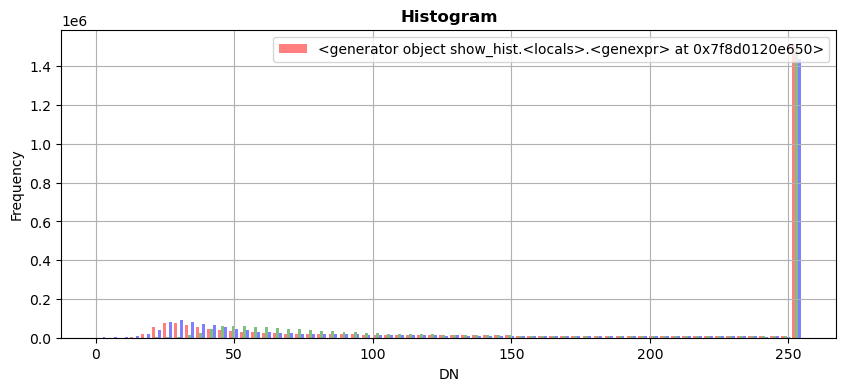

In [69]:
# Visualize histogram of pixel values.
fig, ax = plt.subplots(figsize=(10,4))
rio.plot.show_hist(viz_before, bins=64, stacked=False, alpha=0.5, title="Histogram")
# The legend is not displayed properly, most likely a rasterio matplotlib bug in our bleeding edge jupyter env

## Numpy array manipulations for Display *before & after* 

In [70]:
# Matplotlib, PIL or skimage are expecting Cols,Rows,Bands order
np.moveaxis(viz_before, 0, 2).shape  # Move axis at index 0 to index 2

(1798, 1463, 3)

In [71]:
# There a many ways to change axis order
np.moveaxis(viz_before, 0, 2).shape \
== np.transpose(viz_before, axes=[1, 2, 0]).shape \
== np.rollaxis(viz_before, 0, 3).shape \
== rio.plot.reshape_as_image(viz_before).shape

True

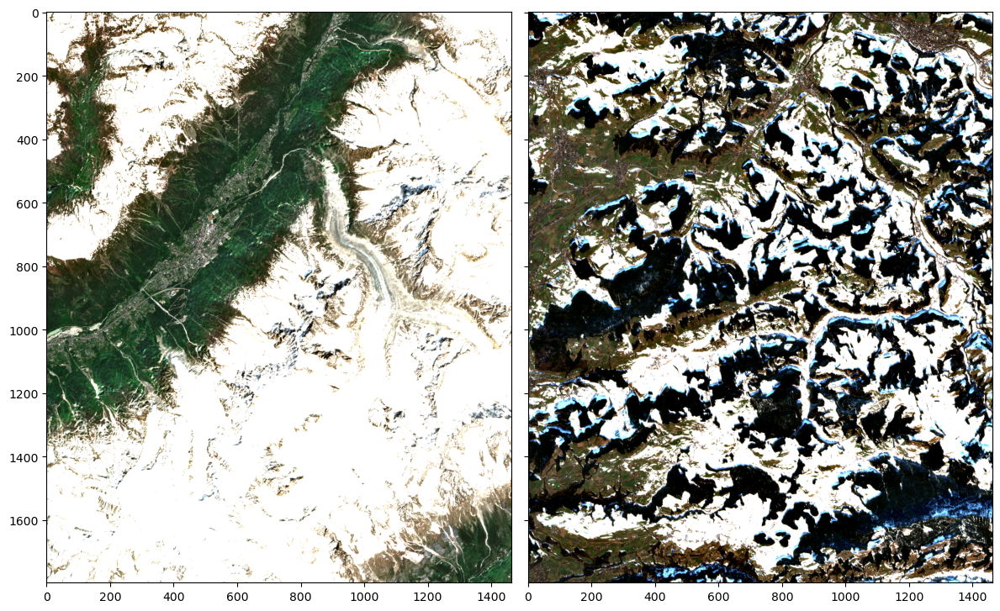

In [72]:
# Plot two images side by side, matplotlib axis with pixel coords
fig, axes = plt.subplots(1,2, figsize=(12,16), sharey=True, layout="tight")
axes[0].imshow(rio.plot.reshape_as_image(viz_before))
axes[1].imshow(rio.plot.reshape_as_image(viz_after))
# Using imshow instead of basic plots ensure the width / height ratio is preserved

## Index Values & computations

### NDVI

In [116]:
def rio_stack(
    item: pystac.Item,
    band_list: list,
    window: rio.windows.Window = None
):
    """Load and stack different bands in a STAC item, return stacked array and geometry profile"""
    array_list = []
    # Collect arrays
    for band_id in band_list:
        url = item.assets[band_id].href
        with rasterio.open(url) as ds:
            profile = ds.profile
            data = ds.read(1, window=window)  # read(1) returns 2D array
            array_list.append(data)
    # Update metadata dict
    profile["count"] = len(array_list)
    if window is not None:
        # Update image geometry
        profile["transform"] = rio.windows.transform(aoi_window, profile["transform"])
        # ! Width and height are integer since we used aoi_window.round_shape() !
        profile["width"], profile["height"] = aoi_window.width, aoi_window.height

    # N.B. this function is valid if only if all bands have the same geometry
    return np.stack(array_list), profile
    

In [124]:
array_before, profile = rio_stack(before, ["B04", "B03", "B02", "B08"], aoi_window)
array_after, profile = rio_stack(after, ["B04", "B03", "B02", "B08"], aoi_window)

# Make sure to check the profile dict
rich.print(profile)

{
    'driver': 'GTiff',
    'dtype': 'uint16',
    'nodata': 0.0,
    'width': 1900,
    'height': 2345,
    'count': 4,
    'crs': CRS.from_epsg(32632),
    'transform': Affine(10.0, 0.0, 395170.0,
       0.0, -10.0, 5205490.0),
    'blockxsize': 512,
    'blockysize': 512,
    'tiled': True,
    'compress': 'deflate',
    'interleave': 'band'
}

In [125]:
array_before.shape, array_after.shape

((4, 1798, 1463), (4, 1798, 1463))

In [126]:
red_before, green_before, blue_before, nir_before = array_before.astype(np.float32)
ndvi_before = (nir_before - red_before) / (nir_before + red_before)
masked_ndvi_before = np.ma.masked_invalid(ndvi_before)

red_after, green_after, blue_after, nir_after = array_after.astype(np.float32)
ndvi_after = (nir_after - red_after) / (nir_after + red_after)
masked_ndvi_after = np.ma.masked_invalid(ndvi_after)

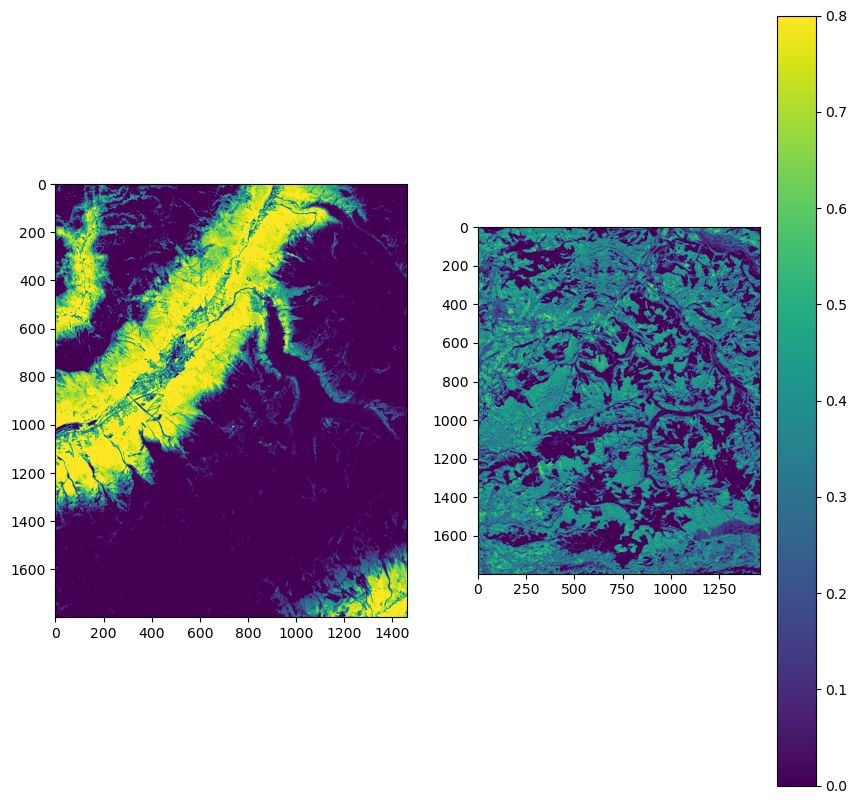

In [127]:
# Then we can use rasterio.fill to interpolate missing values (rasterio understands numpy masked arrays, see the docs)
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10, 10))
ax1.imshow(rio.fill.fillnodata(masked_ndvi_before), vmin=0, vmax=0.8)
ax2.imshow(rio.fill.fillnodata(masked_ndvi_after), vmin=0, vmax=0.8)


fig.colorbar(ax1.get_children()[0])  # Create a colorbar

### NDSI

We tried to directly extract the B12 but it is not the same shape as B08. We will up sample it.

In [141]:
# GSD stands for Ground Sampling Distance
before.assets['B8A'].extra_fields["gsd"] == before.assets['B12'].extra_fields["gsd"]

True

In [129]:
# Resamplign algorithms : 
def rio_open_resampled(url, scale_factor=2):
    """Open a dataset using rasterio and scale pixel size according to given factor"""
    with rio.open(url) as ds:
        profile = ds.profile
        # compute new shape
        new_height, new_width = int(ds.height * scale_factor), int(ds.width * scale_factor)
        # read data and resample on the fly
        data = ds.read(
            out_shape=(ds.count, new_height, new_width),
            resampling=rio.enums.Resampling.cubic
        )  # https://en.wikipedia.org/wiki/Bicubic_interpolation
        # scale image transform
        transform = ds.transform * ds.transform.scale(
            (ds.width / data.shape[-1]),
            (ds.height / data.shape[-2])
        )
        # update metadata
        profile.update({"transform": transform, "height": new_height, "width": new_width})

        return data, profile

In [148]:
swir_before

array([], shape=(1, 0, 1463), dtype=uint16)

In [130]:
array_swir_before, profile = rio_open_resampled(before.assets['B12'].href, scale_factor=2)
array_swir_after, profile_after = rio_open_resampled(after.assets['B12'].href, scale_factor=2)


In [132]:
def windowed_array(array, window):
    col_start, row_start = window.col_off, window.row_off
    col_end, row_end = window.col_off + window.width, window.row_off + window.height
    return array[:, row_start:row_end, col_start:col_end]


In [149]:
swir_before = windowed_array(array_swir_before, aoi_window)
array_before = np.concatenate([array_before, swir_before],axis=0)

swir_after = windowed_array(array_swir_after, aoi_window)
array_after = np.concatenate([array_after, swir_after],axis=0)

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 1798 and the array at index 1 has size 0

## Go back earlier in time with Landsat collection

We want to compare the snow coverage between an earlier date and 2022. Let's see what we can do with the Landsat catalog.

In [73]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [74]:
# Searching for LANDSAT products within ROI and time range
time_of_interest = "2014-02-01/2022-02-01"

search = catalog.search(
    collections=["landsat-8-c2-l2"],
    bbox=bbox,  # or intersects=area_of_interest
    datetime=time_of_interest,
    sortby='datetime',  # By default the query returns latest first, here we sortby ascending
    query={"eo:cloud_cover": {"lt": 10}},  # cloud cover lower than 10%
)
items = search.item_collection()
print(f"Found {len(items)} items\n")

Found 63 items



The earlier date we found with Landsat is 2014. We expect some changes in snow coverage. Let's take a look at some pictures

In [81]:
#Store all images in list to display after
images = {it.id: IPython.display.Image(url=it.assets["rendered_preview"].href, width=800) for it in items}
names = list(images.keys())

In [80]:
#ipywidgets.interact(loadimg,  i=(0, len(images)-1)) #All pictures
ipywidgets.interact(loadimg,  i=[5,6,55,62]) #example of before after

interactive(children=(Dropdown(description='i', options=(5, 6, 55, 62), value=5), Output()), _dom_classes=('wi…

<function __main__.loadimg(i=0)>

We chose to focus our attention on both summers and winters of respectively 2015 & 2021. We can see for the same period that the snow coverage in 2015 was way higher than 2021. 